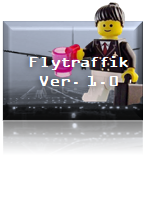

**1. Forretningsforståelse**

```
“Det første er at forstå det forretningsmæssige perspektiv grundigt. 
- Hvad ønsker kunden at opnå?
Indsaml information om forretningssituationen for organisationen. 
Dette lettere identificering af forretningsmål, men identificerer dertil resourcer, 
så som data, viden, personale og hardware resourcer, som senere kan anvendes.
Kunden har mange konkurrerende mål og begrænsninger, der skal være korrekt afstemt. 
Analytikerens mål er at afdække vigtige faktorer i starten af ​​projektet, som kan påvirke det endelige resultat. 
Forsømmelse af dette trin kan resulterer i tid anvendt på at svare rigtigt på de forkerte spørgsmål”

```
<p align = "right"> CRISP-DM 1.0</p>


**Analyse - Ekstern Strategi**


Når vi positionerer os i forhold til det eksterne markedet, må vi forstå konkurrende ydelser i industrien. 
En stigende grad af digitalisering af forretningsdriften kan sikre konkurrencedygtighed:

*   Konkurrence faktorer - 	Estimere kritiskhed af organisatoriske processer (f.eks. David G. McKendrick: From Silicon Vally to Singapore)
*   Platform design - 	Estimere netværks værdi (f.eks. The winner takes it all, )
*   Timing - 	Estimere værdi af først-med-initiative (f.eks. Flash Boys: A Wall Street Revolt)
*   Genskriv reglerne - 	Estimere værdi af markedets konvergence
*   Kontekst overførsel - 	Estimere værdi af krydssalg og synergier




**Mulighedsrum for drifttiltag**

Hvilken fase ønsker jeg at forbedre?

*   **Kontrol** - Hvad er hændt og hvad foregår? Udgangspunkt er fakta, data og værdier, som giver en detajleret analyse.
*   **Diagnose** - Hvorfor er hændelsen indtraffet? Eksaminering af den beskrevende viden og opfordring til årsagsidentification
*   **Forudsigelse** - Hvad vil indtræffe? Faktorer og fokus på fremtidigt udfald.
*   **Prognose** - Hvilkle aktioner burde gøres og hvorfor? Med fokus på beslutningstagning og forbedringer.



<br>
<br>
<br>
<br>
</br>

**Intern Strategi - Flytrafik**

Ved tidligere introduktion til emnet, har vi gennemgået værdiforeslag, som er relevante i dagligvarer sektoren i mødet med privatforbrugeren.

Værdiforeslag

*  Sensorer vurdere tilstand af fly
*  Detektere vedligeholdelsesbehov ogkomponenter, som kan fejle
*  Forudsige vejrforhold ved flyruter
*  Forudsige vulkanudbrud, skovbrand, epidemi mv.
*  Indhente information til eksterne tjenester (kortlægning mv.)
*  Afgør prissætning af billetter
*  Beslutte andele af faste og variable omkostninger
*  Track baggage
*  Automatisere faktuering

**Effektmål**

*   Ydelse
*   Levetid
*   Kvalitet
*   Omkostninger
*   Tilgængelighed






**Eksempel på ruteplanlægnings problem**

**Stadie**: Hver stadie angiver en lokation og tidspunkt. Omkostningen ved en aktion (flysegmente) afhænger af tidligere segmenter, billletprisen, og individets status.

**Initialt stadie**: Specificeret af brugeren på webportal eller lignende

**Aktioner**: Afrejse fra nuværende lokation, i et bestemt klasse, på dagværende tidspunkt, med tilstrækkeligt tid til eventuelle mellemlandinger

**Transitions model**: Stadie, som resultat af flyrejse fra oprindeligt lokation til destination på det givne tidspunkt

**Mål**: Ankommer brugen til den givne lokation, som specificeret?

**Rute omkostning**: Omkostningen, som funktion af rejse omkostning, ventetid, tid i luften, fortoldningsforløb, sæddekvalitet, tid på dagen, type af fly og optjening af rejsepoint og så videre.


For at strukturer datasættet, kræves digital tovtrækkeri eller *data wrangling*, såsom opdeling af data, indtil opgaven er overkommelig.

https://vega.github.io/vega/tutorials/airports/

**2. Data forståelse**

```
”Indhent de data eller sikre adgang til dataene
Denne første indsamling inkluderer data indlæsning, om nødvendigt for dataforståelse. 
For eksempel, hvis du bruger et specifikt værktøj til dataforståelse, giver det mening at indlæse dine data i det relevante værktøj. 
Husk, at enhver vurdering af datakvaliteten ikke kun skal foretages af de enkelte datakilder, men også af alle data. 
Ved sammenlægning af datakilder kan uoverensstemmelser mellem kilderne, 
og flettede data give problemer, der ikke findes i de enkelte datakilder.”

```
<p align = "right"> CRISP-DM 1.0</p>




En oversigt over flyrouter kan gives på følgende vis

In [2]:
#@title Norwegian fly
import altair as alt
from vega_datasets import data
import pandas as pd


url = 'https://raw.githubusercontent.com/jfrausig/test/master/data_norwegian.txt'
countries = alt.topo_feature('https://dmws.hkvservices.nl/dataportal/data.asmx/read?database=vega&key=europe', 'europe') 

# Create mouseover selection
select_city = alt.selection_single(
    on="mouseover", nearest=True, fields=["from_airport"], empty="none"
)

lookup_data = alt.LookupData(
    url, key="from_airport", fields=["from_country", "from_lat", "from_long"]
)

lookup_data_1 = alt.LookupData(
    url, key="from_country", fields=["from_airport"]
)


background =alt .  Chart ( countries ) .  mark_geoshape (fill="lightgray",stroke= "white").project(
    type= 'mercator',
    scale= 350,                          # Magnify
    center= [10,58],                     # [lon, lat]
) .  properties (
     width = 500 ,
     height = 300
 ).properties(width=500,height=500)


connections = alt.Chart(url).mark_rule(opacity=0.35).encode(
    latitude="from_lat:Q",
    longitude="from_long:Q",
    latitude2="to_lat:Q",
    longitude2="to_long:Q"
).transform_lookup(
    lookup="from_airport",
    from_=lookup_data
).transform_lookup(
    lookup="to_airport",
    from_=lookup_data,
    as_=["to_airport", "to_lat:Q", "to_long:Q"]
).transform_filter(
    select_city
).project(
    type= 'mercator',
    scale= 350,                          # Magnify
    center= [10,58],                     # [lon, lat]
    #clipExtent= [[0, -100], [800, 800]],    # [[left, top], [right, bottom]]
).properties(width=500,height=500)


points = alt.Chart(url).mark_circle().encode(
    latitude="from_lat:Q",
    longitude="from_long:Q",
    size=alt.Size("routes:Q", scale=alt.Scale(range=[0, 50]), legend=None),
    order=alt.Order("routes:Q", sort="descending"),
    tooltip=["from_airport:N", "routes:Q", "routes:Q"],
    color=alt.Color('color:Q', scale=None),
).transform_aggregate(
    routes="count()",
    groupby=["from_airport"]
).transform_lookup(
    lookup="from_airport",
    from_=lookup_data
).add_selection(
    select_city

).project(
    type= 'mercator',
    scale= 350,                          # Magnify
    center= [10,58],                   # [lon, lat]

).properties(width=500,height=500)



# airport positions on background
points_1 = alt.Chart(url).mark_circle(
    size=10,
    color='black'
).encode(
    longitude='to_long:Q',
    latitude='to_lat:Q',
    tooltip=['to_airport:Q', 'to_city:Q']
).project(
    type= 'mercator',
    scale= 350,                          # Magnify
    center= [10,58],                     # [lon, lat]

).properties(width=500,height=500)



(background + connections + points+points_1).configure_view(stroke=None)




alt.LayerChart(...)

Tidsserien kan se på følgende måde

In [3]:
#@title Interaktivt valg af tidsserie segment
alt.data_transformers.disable_max_rows()

url="https://raw.githubusercontent.com/jfrausig/test/master/Avinor_fly_2.csv"
data=pd.read_csv(url)
data.index=data.Dato

brush = alt.selection(type='interval', encodings=['x'] )


base = alt.Chart(data).mark_line().transform_fold(
    ['Totalt_OSL_rute','SAS_rute','Norwegian_rute','Wideroe_rute','Andre_rute']

).encode(
    alt.Y('value:Q', scale=alt.Scale(domain=(0.2, 1))),
    x='Dato:T',

    color='key:N'
).properties(width=800,height=400)



upper = base.encode(
    alt.X('Dato:T', scale=alt.Scale(domain=brush))
)

lower = base.properties(
    height=60
).add_selection(brush)


upper & lower




alt.VConcatChart(...)

Vejrdata kan indhentes fra nærliggende vejrstation

In [4]:
#@title data fra vejrstation
import pandas as pd
url="https://lmt.nibio.no/agrometbase/showweatherdata.php?weatherstation=44&elementMeasurementTypes%5B%5D=13&loginterval=3&valuetype=value_controlled&date_start=2016-02-27&date_end=2020-10-09&format=csv&separator=comma&adjustForDST=true"
weather_data  = pd.read_csv(url,header=0,delimiter=",") 

weather_data

,Time measured,Vindhastighet i 2m,60 min middel (FM2)
0,2016-02-27 00:00:00+01,0.1,NaN
1,2016-02-28 00:00:00+01,0.1,NaN
2,2016-02-29 00:00:00+01,0.2,NaN
3,2016-03-01 00:00:00+01,1.2,NaN
4,2016-03-02 00:00:00+01,2.5,NaN
...,...,...,...
1682,2020-10-05 00:00:00+02,1.3,NaN
1683,2020-10-06 00:00:00+02,1.2,NaN
1684,2020-10-07 00:00:00+02,0.9,NaN
1685,2020-10-08 00:00:00+02,0.5,NaN


Datakolonnerne må opnavngives, såledelse at kolonnerne er nemmere at referer til

In [5]:
#@title omnavngivning af kolonner
column_names=['Time_measured','Vindhastighet','delete']
test=weather_data
col_dict = {test.columns[0]: column_names[0], test.columns[1]: column_names[1], test.columns[2]: column_names[2],}   ## key→old name, value→new name

test.columns = [col_dict.get(x, x) for x in test.columns]
test.columns
weather_data=test
weather_data=pd.DataFrame(weather_data)
weather_data

,Time_measured,Vindhastighet,delete
0,2016-02-27 00:00:00+01,0.1,NaN
1,2016-02-28 00:00:00+01,0.1,NaN
2,2016-02-29 00:00:00+01,0.2,NaN
3,2016-03-01 00:00:00+01,1.2,NaN
4,2016-03-02 00:00:00+01,2.5,NaN
...,...,...,...
1682,2020-10-05 00:00:00+02,1.3,NaN
1683,2020-10-06 00:00:00+02,1.2,NaN
1684,2020-10-07 00:00:00+02,0.9,NaN
1685,2020-10-08 00:00:00+02,0.5,NaN


Tidsangivelsen for begge datasæt må være kompatibel 

In [6]:
#@title reformattering af tidsangivelse
dates = pd.to_datetime(weather_data['Time_measured'])
dates=dates.apply(lambda x: x.strftime('%Y/%m/%d'))
dates

weather_data.index=dates
weather_data

,Time_measured,Vindhastighet,delete
Time_measured,,,
2016/02/27,2016-02-27 00:00:00+01,0.1,NaN
2016/02/28,2016-02-28 00:00:00+01,0.1,NaN
2016/02/29,2016-02-29 00:00:00+01,0.2,NaN
2016/03/01,2016-03-01 00:00:00+01,1.2,NaN
2016/03/02,2016-03-02 00:00:00+01,2.5,NaN
...,...,...,...
2020/10/05,2020-10-05 00:00:00+02,1.3,NaN
2020/10/06,2020-10-06 00:00:00+02,1.2,NaN
2020/10/07,2020-10-07 00:00:00+02,0.9,NaN


De 2 datasæt kan nu kombineres såledelse

In [9]:
#@title samføring af datasæt
data['Vindhastighet']=weather_data['Vindhastighet']
data

,Dato,Totalt_OSL_Avg,Totalt_OSL_Fors,Totalt_OSL_rute,SAS_Avg,SAS_Fors,SAS_rute,Norwegian_Avg,Norwegian_Fors,Norwegian_rute,Wideroe_Avg,Wideroe_Fors,Wideroe_rute,Andre_Avg,Andre_Fors,Andre_rute,Vindhastighet
Dato,,,,,,,,,,,,,,,,,
2016/02/27,2016/02/27,163,36,0.78,65,21,0.68,42,5,0.88,8,3,0.63,48,7,0.85,0.1
2016/02/28,2016/02/28,315,79,0.75,130,33,0.75,107,38,0.65,23,3,0.87,55,5,0.91,0.1
2016/02/29,2016/02/29,341,61,0.82,144,18,0.88,111,27,0.76,27,1,0.96,59,15,0.75,0.2
2016/03/01,2016/03/01,340,41,0.88,139,17,0.88,111,16,0.86,28,2,0.93,62,6,0.90,1.2
2016/03/02,2016/03/02,344,87,0.75,145,44,0.70,108,30,0.72,29,3,0.90,62,10,0.84,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020/10/05,2020/10/05,163,2,0.99,72,1,0.99,55,1,0.98,16,0,1.00,20,0,1.00,1.3
2020/10/06,2020/10/06,150,2,0.99,68,0,1.00,50,1,0.98,17,0,1.00,15,1,0.93,1.2
2020/10/07,2020/10/07,158,2,0.99,69,0,1.00,54,2,0.96,16,0,1.00,19,0,1.00,0.9


In [7]:
data.to_csv('data.csv')

Vindstyrken kan vises som graf

In [10]:
#@title vindstyrke


alt.Chart(data).mark_line().encode(
    alt.Y('Vindhastighet:Q'),
    x='Dato:T',


).properties(width=800,height=400)



alt.Chart(...)

For at få et indblik i om vindstyrke og flyforsinkelser er korreleret kan begge vises interaktivt

In [11]:
#@title Interaktivt visning af vindstyrke og flyforsinkelser
alt.data_transformers.disable_max_rows()


brush = alt.selection(type='interval', encodings=['x'] )


base = alt.Chart(data).mark_line().transform_fold(
    ['Totalt_OSL_rute','SAS_rute','Norwegian_rute','Wideroe_rute','Andre_rute']

).encode(
    alt.Y('value:Q', scale=alt.Scale(domain=(0.2, 1))),
    x='Dato:T',

    color='key:N'
).properties(title="Procentdel af fly, som var forsinket",width=800,height=300)



upper = base.encode(
    alt.X('Dato:T', scale=alt.Scale(domain=brush))
)

lower = base.properties(
    height=60
).add_selection(brush)

weather= alt.Chart(data).mark_line().encode(
    alt.Y('Vindhastighet:Q'),
    alt.X('Dato:T', scale=alt.Scale(domain=brush))


).properties(width=800,height=400)


weather & upper & lower




alt.VConcatChart(...)

In [12]:
#@title Interaktivt valg af tidsserie segment
alt.data_transformers.disable_max_rows()

url="https://raw.githubusercontent.com/jfrausig/test/master/Avinor_fly_2.csv"
data=pd.read_csv(url)
data.index=data.Dato

brush = alt.selection(type='interval', encodings=['x'] )


base = alt.Chart(data).mark_line().transform_window(
    Totalt_OSL_rute_rolling_mean='mean(Totalt_OSL_rute)',
    frame=[-15, 15]
).transform_fold(
    ['Totalt_OSL_rute','Totalt_OSL_rute_rolling_mean']

).encode(
    alt.Y('value:Q', scale=alt.Scale(domain=(0.2, 1))),
    x='Dato:T',

    color='key:N'
).properties(width=800,height=400)



upper = base.encode(
    alt.X('Dato:T', scale=alt.Scale(domain=brush))
)

lower = base.properties(
    height=60
).add_selection(brush)


upper & lower




alt.VConcatChart(...)

#Sattelit data

Ekstern sattelit data kan hentes såledelse

Dette anbefales at oprette sit eget login, med relevant 
*   brugernavn
*   kodeord


In [ ]:
#@title indhenting af sattelit data
import pandas as pd

brugernavn="jesper%2540frausig.com" #"eksempel_email%2540address.no"     #opret konto på CAMS radiation (http://www.soda-pro.com/es/web-services/radiation/cams-radiation-service) og indtast den tilknyttet email address og erstate @ med %2540. 



url="http://www.soda-is.com/service/wps?Service=WPS&Request=Execute&Identifier=get_cams_radiation&version=1.0.0&DataInputs=latitude=64.963051;longitude=-19.020835;altitude=60;date_begin=2010-03-19;date_end=2010-03-21;verbose=true;time_ref=UT;summarization=PT01M;username="+brugernavn+"&RawDataOutput=irradiation"
data  = pd.read_csv(url,skiprows=68-1,header=0,delimiter=";") 

from datetime import datetime
dateEnds=data['# Observation period']

timeEnds = list()
for i in range(0, len(dateEnds)):
  time = datetime.strptime(dateEnds[i].split(".")[0], "%Y-%m-%dT%H:%M:%S")
  #print('Year, month, day, hour, min', time.year, time.month, time.day, time.hour, time.minute)
  timeEnds.append(time)
timeEnds

data.index=timeEnds

column_names=['Observation period','TOA','SF_GHI','SF_BHI','SF_DHI','SF_BNI','GHI','BHI','DHI','BNI','Paalidelighed','sza','sommer_vinter_del','tco3','tcwv','AOD_BC','AOD_DU','AOD_SS','AOD_OR','AOD_SU','AOD_NI','AOD_AM','alpha','Aerosol_type','fiso','fvol','fgeo','albedo','Sky_optisk_dybde','Sky_daekningsgrad','Sky_type','GHI_ingen_korr','BHI_ingen_korr','DHI_ingen_korr','BNI_ingen_korr']

test=data
col_dict = {test.columns[0]: column_names[0], test.columns[1]: column_names[1],test.columns[2]: column_names[2], test.columns[3]: column_names[3],test.columns[4]: column_names[4], test.columns[5]: column_names[5],test.columns[6]: column_names[6], test.columns[7]: column_names[7],test.columns[8]: column_names[8],test.columns[9]: column_names[9],test.columns[10]: column_names[10], test.columns[11]: column_names[11],test.columns[12]: column_names[12], test.columns[13]: column_names[13],test.columns[14]: column_names[14], test.columns[15]: column_names[15],test.columns[16]: column_names[16], test.columns[17]: column_names[17],test.columns[18]: column_names[18],test.columns[19]: column_names[19],test.columns[20]: column_names[20], test.columns[21]: column_names[21],test.columns[22]: column_names[22], test.columns[23]: column_names[23],test.columns[24]: column_names[24], test.columns[25]: column_names[25],test.columns[26]: column_names[26], test.columns[27]: column_names[27],test.columns[28]: column_names[28],test.columns[29]: column_names[29],test.columns[30]: column_names[30], test.columns[31]: column_names[31],test.columns[32]: column_names[32], test.columns[33]: column_names[33],test.columns[34]: column_names[34]}   ## key→old name, value→new name
test.columns = [col_dict.get(x, x) for x in test.columns]
test.columns
data.drop(columns=['TOA','sommer_vinter_del','sza','tco3','tcwv','AOD_SS','AOD_OR','AOD_SU','AOD_NI','AOD_AM','fiso','fvol','fgeo','GHI_ingen_korr','BHI_ingen_korr','DHI_ingen_korr','BNI_ingen_korr'],inplace=True)
data['Timestamp']=data.index

data

,Observation period,SF_GHI,SF_BHI,SF_DHI,SF_BNI,GHI,BHI,DHI,BNI,Paalidelighed,AOD_BC,AOD_DU,alpha,Aerosol_type,albedo,Sky_optisk_dybde,Sky_daekningsgrad,Sky_type,Timestamp
2010-03-19 00:00:00,2010-03-19T00:00:00.0/2010-03-19T00:01:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0009,0.0126,NaN,-1,NaN,NaN,-1,-1,2010-03-19 00:00:00
2010-03-19 00:01:00,2010-03-19T00:01:00.0/2010-03-19T00:02:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0009,0.0126,NaN,-1,NaN,NaN,-1,-1,2010-03-19 00:01:00
2010-03-19 00:02:00,2010-03-19T00:02:00.0/2010-03-19T00:03:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0009,0.0126,NaN,-1,NaN,NaN,-1,-1,2010-03-19 00:02:00
2010-03-19 00:03:00,2010-03-19T00:03:00.0/2010-03-19T00:04:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0009,0.0126,NaN,-1,NaN,NaN,-1,-1,2010-03-19 00:03:00
2010-03-19 00:04:00,2010-03-19T00:04:00.0/2010-03-19T00:05:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0009,0.0126,NaN,-1,NaN,NaN,-1,-1,2010-03-19 00:04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-03-21 23:55:00,2010-03-21T23:55:00.0/2010-03-21T23:56:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0022,0.0181,NaN,-1,NaN,NaN,-1,-1,2010-03-21 23:55:00
2010-03-21 23:56:00,2010-03-21T23:56:00.0/2010-03-21T23:57:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0022,0.0182,NaN,-1,NaN,NaN,-1,-1,2010-03-21 23:56:00
2010-03-21 23:57:00,2010-03-21T23:57:00.0/2010-03-21T23:58:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0022,0.0182,NaN,-1,NaN,NaN,-1,-1,2010-03-21 23:57:00
2010-03-21 23:58:00,2010-03-21T23:58:00.0/2010-03-21T23:59:00.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0022,0.0182,NaN,-1,NaN,NaN,-1,-1,2010-03-21 23:58:00


Bestemte vejrfænomere kan undersøges såledelse

In [ ]:
#@title Vulkanudbrud på island
import altair as alt
alt.data_transformers.disable_max_rows()

AOD=alt.Chart(data).mark_line(color='black').encode(
    alt.Y('AOD_BC:Q', axis=alt.Axis(title='Sort kulstof partikler (AOD_BC)',titleColor='black')),
    x='Timestamp:T',
)

GHI=alt.Chart(data).mark_line(color='orange').encode(
    alt.Y('GHI:Q', axis=alt.Axis(title='Solindstråling (GHI)',titleColor='orange')),
    x='Timestamp:T',
)

Vulkanudbrud=alt.layer(GHI,AOD).interactive().resolve_scale(
    y='independent'
).properties(
    title='Vulkanudbrud på Island'
).properties(width=800,height=200)


Vulkanudbrud

alt.LayerChart(...)

Vi kan også nøjes med at fokusere på luftforudregningen

In [ ]:
#@title luftforudregning
AOD_2=alt.Chart(data).mark_line(color='black').encode(
    alt.Y('AOD_BC:Q', axis=alt.Axis(title='Sort kulstof partikler (AOD_BC)',titleColor='black')),
    alt.X('Timestamp:T', axis=alt.Axis(title='Klokkeslæt',titleColor='black')),
    tooltip=['AOD_BC:Q','Timestamp:T']
).properties(title='Luftforudregning', width=600, height=200)

AOD_2

alt.Chart(...)

Vi kan udvikle et simplet dashboard

In [ ]:
#@title Fordeling af luftforudregning

brush = alt.selection(type='interval', encodings=['x'],name='sel')
graensevardi = alt.binding_range(min=0.0001, max=0.1, step=0.001,name="graensevardi")


AOD_2=alt.Chart(data).mark_line(color='black').encode(
    alt.Y('AOD_BC:Q', axis=alt.Axis(title='Sort kulstof partikler (AOD_BC)',titleColor='black')),
    alt.X('Timestamp:T', axis=alt.Axis(title='Klokkeslæt',titleColor='black')),
    tooltip=[alt.Tooltip('AOD_BC:Q', format='.1e'),'Timestamp:T',alt.Tooltip('ovre_std_1:Q', format='.1e'),alt.Tooltip('nedre_std_1:Q', format='.1e'),alt.Tooltip('ovre_std_2:Q', format='.1e'),alt.Tooltip('nedre_std_2:Q', format='.1e')]
  

).properties(title='Luftforudregning', width=800, height=200).add_selection(brush)

line=alt.Chart(data).mark_area(color='darkblue',opacity=0.2).encode(
    x='Timestamp:T',
    y='nedre_std_1:Q',
    y2='ovre_std_1:Q'
)


line_2=alt.Chart(data).mark_area(color='blue',opacity=0.1).encode(
    x='Timestamp:T',
    y='nedre_std_2:Q',
    y2='ovre_std_2:Q',
    
)

rolling_mean=alt.Chart(data).mark_line(color='blue',opacity=0.6).encode(
    x='Timestamp:T',
    y='mean_line:Q',
)


text = alt.Chart(data).mark_text(align='right',color="grey",angle=270,fontSize=12).encode(
    x=alt.value(795),  # pixels from left
    y=alt.value(100),  # pixels from top
    text='text_string:N'
).transform_calculate(

)

graenesvaerdi=alt.Chart(data).mark_point().encode(
    x='Timestamp:T',
    y='graensevardi:Q',
 
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
)
histogram = alt.Chart(data).transform_filter(
    brush
).transform_fold(
    ['mean_line','ovre_std_1','nedre_std_1','ovre_std_2','nedre_std_2'],

).transform_window(
    sum='sum(AOD_BC)',
    frame=[None,None]
).transform_calculate(
    fordeling='(datum.AOD_BC-datum.graensevardi)', #)/datum.graensevardi',
    sandsynlighed='datum.value/datum.sum',
    constant='0.05'
).mark_bar(color="darkblue",opacity=0.5).encode(
    alt.X('mean_line:Q',title="Sort kulstof partikler (AOD_BC)", bin=alt.Bin(maxbins=20)),
    alt.Y('count()', stack=None,title="count"),
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
).properties(title="Fordeling af kulstof partikler",width=800, height=200)


alt.vconcat(AOD_2+text+line+line_2+rolling_mean+graenesvaerdi , histogram).transform_window(
    stdev_window='stdev(AOD_BC)',
    mean_window='mean(AOD_BC)',
    frame=[-240, 240],
).transform_calculate(
    stdev_line=alt.datum.stdev_window,
    mean_line=alt.datum.mean_window,
    ovre_std_1='datum.mean_line+1*datum.stdev_line',
    nedre_std_1='datum.mean_line-1*datum.stdev_line',
    ovre_std_2='datum.mean_line+2*datum.stdev_line',
    nedre_std_2='datum.mean_line-2*datum.stdev_line',
    graensevardi='graensevardi.graensevardi*1',
    color_graensevardi='if(datum.AOD_BC>datum.graensevardi,-1,2)',
    constant='2',

).add_selection(
     alt.selection_single(fields=['graensevardi'], bind=graensevardi , name='graensevardi', init={"graensevardi":'0.0011'}),
)




alt.VConcatChart(...)

Dashboardet 

In [ ]:
#@title Dashboard for luftforudregning
import altair as alt
import pandas as pd
alt.data_transformers.disable_max_rows()
brush = alt.selection(type='interval', encodings=['x'],name='sel',init = {'x':['2005-03-01', '2005-04-01']})
graensevardi = alt.binding_range(min=0.0001, max=0.1, step=0.001,name="graensevardi")

base=alt.Chart(data).mark_line(color='black').encode(
    alt.Y('AOD_BC:Q', axis=alt.Axis(title='Sort kulstof partikler (AOD_BC)',titleColor='black')),
    alt.X('Timestamp:T', axis=alt.Axis(title='Klokkeslæt',titleColor='black')),
       tooltip=[alt.Tooltip('AOD_BC:Q', format='.1e'),'Timestamp:T',alt.Tooltip('ovre_std_1:Q', format='.1e'),alt.Tooltip('nedre_std_1:Q', format='.1e'),alt.Tooltip('ovre_std_2:Q', format='.1e'),alt.Tooltip('nedre_std_2:Q', format='.1e')]
  
).properties(title='Luftforudregning', width=800, height=200)


AOD_2=base.mark_line(color='black').add_selection(brush)

line=alt.Chart(data).mark_area(color='darkblue',opacity=0.2).encode(
    x='Timestamp:T',
    y='nedre_std_1:Q',
    y2='ovre_std_1:Q'
)


line_2=alt.Chart(data).mark_area(color='blue',opacity=0.1).encode(
    x='Timestamp:T',
    y='nedre_std_2:Q',
    y2='ovre_std_2:Q',
    
)

rolling_mean=alt.Chart(data).mark_line(color='blue',opacity=0.6).encode(
    x='Timestamp:T',
    y='mean_line:Q',
)


text = alt.Chart(data).mark_text(align='right',color="grey",angle=270,fontSize=12).encode(
    x=alt.value(795),  # pixels from left
    y=alt.value(100),  # pixels from top
    text='text_string:N'
).transform_calculate(
  text_string="'J. Ørntoft Frausig'",
  #cor=format('datum
)

graenesvaerdi=alt.Chart(data).mark_point().encode(
    x='Timestamp:T',
    y='graensevardi:Q',
 
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
)
histogram = alt.Chart(data).transform_filter(
    brush
).transform_fold(
    ['mean_line','ovre_std_1','nedre_std_1','ovre_std_2','nedre_std_2'],

).transform_window(
    sum='sum(AOD_BC)',
    frame=[None,None]
).transform_calculate(
    fordeling='(datum.AOD_BC-datum.graensevardi)', #)/datum.graensevardi',
    sandsynlighed='datum.value/datum.sum',
    constant='0.05'
).mark_bar(color="darkblue",opacity=0.5).encode(
    alt.X('mean_line:Q',title="Sort kulstof partikler (AOD_BC)", bin=alt.Bin(maxbins=20)),
    alt.Y('count()', stack=None,title="count"),
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
).properties(title="Fordeling af kulstof partikler",width=800, height=200)

linear_regression=base.transform_filter(
    brush
).transform_regression('Timestamp', 'AOD_BC').mark_line(color="red")





alt.vconcat(AOD_2+text+line+line_2+rolling_mean+graenesvaerdi +linear_regression, histogram).transform_window(
    stdev_window='stdev(AOD_BC)',
    mean_window='mean(AOD_BC)',
    frame=[-240, 240],
).transform_calculate(
    stdev_line=alt.datum.stdev_window,
    mean_line=alt.datum.mean_window,
    ovre_std_1='datum.mean_line+1*datum.stdev_line',
    nedre_std_1='datum.mean_line-1*datum.stdev_line',
    ovre_std_2='datum.mean_line+2*datum.stdev_line',
    nedre_std_2='datum.mean_line-2*datum.stdev_line',
    graensevardi='graensevardi.graensevardi*1',
    color_graensevardi='if(datum.AOD_BC>datum.graensevardi,-1,2)',
    constant='2',

).add_selection(
     alt.selection_single(fields=['graensevardi'], bind=graensevardi , name='graensevardi', init={"graensevardi":'0.0011'}),
)




alt.VConcatChart(...)

Vi kan se på forskellige aspekter af tidsserien, såsom seasonalitet, trend og residual

In [ ]:
#@title Dashboard Luftforudregning
import altair as alt
import pandas as pd
alt.data_transformers.disable_max_rows()
brush = alt.selection(type='interval', encodings=['x'],name='sel',init = {'x':['2005-03-01', '2005-04-01']})
graensevardi = alt.binding_range(min=0.0001, max=0.1, step=0.001,name="graensevardi")

base=alt.Chart(data).mark_line(color='black').encode(
    alt.Y('AOD_BC:Q', axis=alt.Axis(title='Sort kulstof partikler (AOD_BC)',titleColor='black')),
    alt.X('Timestamp:T', axis=alt.Axis(title='Klokkeslæt',titleColor='black')),
       tooltip=[alt.Tooltip('AOD_BC:Q', format='.1e'),'Timestamp:T',alt.Tooltip('ovre_std_1:Q', format='.1e'),alt.Tooltip('nedre_std_1:Q', format='.1e'),alt.Tooltip('ovre_std_2:Q', format='.1e'),alt.Tooltip('nedre_std_2:Q', format='.1e')]
  
).properties(title='Weather app', width=800, height=200)


AOD_2=base.mark_line(color='black').add_selection(brush)

line=alt.Chart(data).mark_area(color='darkblue',opacity=0.2).encode(
    x='Timestamp:T',
    y='nedre_std_1:Q',
    y2='ovre_std_1:Q'
)


line_2=alt.Chart(data).mark_area(color='blue',opacity=0.1).encode(
    x='Timestamp:T',
    y='nedre_std_2:Q',
    y2='ovre_std_2:Q',
    
)

rolling_mean=alt.Chart(data).mark_line(color='blue',opacity=0.6).encode(
    x='Timestamp:T',
    y='mean_line:Q',
)


text = alt.Chart(data).mark_text(align='right',color="grey",angle=270,fontSize=12).encode(
    x=alt.value(795),  # pixels from left
    y=alt.value(100),  # pixels from top
    text='text_string:N'
).transform_calculate(

)

graenesvaerdi=alt.Chart(data).mark_point().encode(
    x='Timestamp:T',
    y='graensevardi:Q',
 
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
)
histogram = alt.Chart(data).transform_filter(
    brush
).transform_fold(
    ['mean_line','ovre_std_1','nedre_std_1','ovre_std_2','nedre_std_2'],

).transform_window(
    sum='sum(AOD_BC)',
    frame=[None,None]
).transform_calculate(
    fordeling='(datum.AOD_BC-datum.graensevardi)', #)/datum.graensevardi',
    sandsynlighed='datum.value/datum.sum',
    constant='0.05'
).mark_bar(color="darkblue",opacity=0.5).encode(
    alt.X('mean_line:Q',title="Sort kulstof partikler (AOD_BC)", bin=alt.Bin(maxbins=20)),
    alt.Y('count()', stack=None,title="count"),
    color=alt.Color('color_graensevardi:N', scale=alt.Scale(scheme="pinkyellowgreen"), legend=None),
).properties(title="Fordeling af kulstof partikler",width=800, height=200)

linear_regression=base.transform_filter(
    brush
).transform_regression('Timestamp', 'AOD_BC').mark_line(color="red")




Seasonality=alt.Chart(data).mark_line(color='black').encode(
    alt.X('Timestamp:T',axis=alt.Axis(labels=False)),
    y='seasonality:Q',

).properties(title="Seasonality",width=800, height=50)


Trend=alt.Chart(data).mark_line(color='black').encode(
    alt.X('Timestamp:T',axis=alt.Axis(labels=False)),
    y='trend:Q',

).properties(title="Trend",width=800, height=50)


residual=alt.Chart(data).mark_line(color='black').encode(
    x='Timestamp:T',
    y='residual:Q',

).properties(title="Residual",width=800, height=50)

alt.vconcat(AOD_2+text+line+line_2+rolling_mean+graenesvaerdi +linear_regression,histogram,Seasonality,Trend,residual).transform_window(
    stdev_window='stdev(AOD_BC)',
    mean_window='mean(AOD_BC)',
    frame=[-240, 240],
).transform_calculate(
    stdev_line=alt.datum.stdev_window,
    mean_line=alt.datum.mean_window,
    ovre_std_1='datum.mean_line+1*datum.stdev_line',
    nedre_std_1='datum.mean_line-1*datum.stdev_line',
    ovre_std_2='datum.mean_line+2*datum.stdev_line',
    nedre_std_2='datum.mean_line-2*datum.stdev_line',
    graensevardi='graensevardi.graensevardi*1',
    color_graensevardi='if(datum.AOD_BC>datum.graensevardi,-1,2)',
    constant='2',

).transform_window(
    trend='mean(AOD_BC)',
    frame=[-960,960]
).transform_window(
    last='last_value(mean_line)',
    frame=[0,1]
).transform_calculate(
    seasonality='datum.last-datum.mean_line',
    residual='datum.AOD_BC-(datum.trend+datum.seasonality)' #+datum.seasonality
).add_selection(
     alt.selection_single(fields=['graensevardi'], bind=graensevardi , name='graensevardi', init={"graensevardi":'0.0011'}),
)




alt.VConcatChart(...)

# Differentiering og interaktiv tangent af kurve

En serie af tal kan differentere på følgende vise

In [ ]:
#@title differentiere af kurve
source=pd.DataFrame()
source['x']=list(range(0,100))
source['x']=source['x']/10


alt.Chart(source).transform_calculate(

    x_x='datum.x/PI',
    f_x='sin(datum.x)'
).transform_window(
    prior='first_value(f_x)',
    frame=[-1,0]
).transform_calculate(
    diff='datum.f_x-datum.prior'
).transform_fold(
    ['f_x','diff']

).mark_line().encode(
    x='x_x:Q',
    y='value:Q',
    color='key:N'
).interactive()




alt.Chart(...)

En tangent til linje vises

In [ ]:
#@title visning af tangent
source=pd.DataFrame()
source['x']=list(range(0,100))
source['x']=source['x']/10


brush = alt.selection(type='interval', encodings=['x'],name='sel',init = {'x':['0', '1']})

base=alt.Chart(source).transform_calculate(

    x_x='datum.x/PI',
    f_x='sin(datum.x)'
).transform_window(
    prior='last_value(f_x)',
    frame=[0,10]
).transform_calculate(
    diff='datum.f_x-datum.prior'
).mark_line().encode(
    x='x:Q',
    y='f_x:Q',

)


diagram=base.transform_fold(
    ['f_x','diff']

).encode(
    x='x:Q',
    y='value:Q',
    color='key:N'
).add_selection(brush)


linear_regression=base.transform_filter(
    brush
).transform_regression('x', 'f_x').mark_line(color="red")


(diagram+linear_regression)

alt.LayerChart(...)